In [1]:
from keras import Input, layers, backend, Model, losses, datasets, models, metrics, optimizers, initializers
from keras.utils import Sequence
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:

class FelixSequence(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        """Here self.x is a list of paths to .npy input files. self.y is a
        corresponding list of paths to .npy output files."""
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print(np.array([np.load(file_name) for file_name in batch_x]).shape, np.array([np.load(file_name) for file_name in batch_y]).shape)
        return np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_x]), np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_y])
    

def gen_paths_labels(base_path = "D:\\Uni Work\\Masters Project\\electron_dists\\Data\\VAE_000_1\\Data"):
    """A generator to yield (data-paths, corresponding labels) tuples for each
    segment of data (typically training, validation, and testing)."""
    for segment in sorted(os.listdir(base_path)):
        segment_path = os.path.join(base_path, segment)
        input_paths = []
        output_paths = []
        for crystal in os.listdir(segment_path):
            crystal_path = os.path.join(segment_path, crystal)
            files = sorted(os.listdir(crystal_path))
            input_paths.append(os.path.join(crystal_path, files[0]))
            output_paths.append(os.path.join(crystal_path, files[1]))
        yield [input_paths, output_paths]

def gen_paths_fromfile(Path):
    input_paths = []
    output_paths = []
    with open(Path) as textFile:
        lines = [line.split() for line in textFile]
    #print(lines)
    for i in lines:
        output_paths.append(i[0])
        input_paths.append(i[0].split("Output.npy")[0] + "Input.npy")
    return([input_paths, output_paths])

In [3]:
latent_dim = 10

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [4]:
"""
## Build the encoder
"""
encoder_inputs = Input(shape=(128, 128, 1))
x = layers.Conv2D(32, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
#x = layers.Dropout(0.25)(x) #APPARANTLY THEY ARE BAD
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var", kernel_initializer='zeros', bias_initializer='zeros')(x)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 32)   2080        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 32, 32, 64)   131136      conv2d[0][0]                     
__________________________________________________________________________________________________
flatten (Flatten)               (None, 65536)        0           conv2d_1[0][0]                   
____________________________________________________________________________________________

In [5]:
"""
## Build the decoder
"""


latent_inputs = Input(shape=(latent_dim,))
x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
#x = layers.Dropout(0.25)(x)
x = layers.Reshape((32, 32, 64))(x)
x = layers.Conv2DTranspose(128, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, kernel_size = (2, 2), activation="relu", padding="same")(x)
decoder = Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()


Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 10)]              0         
_________________________________________________________________
dense_1 (Dense)              (None, 65536)             720896    
_________________________________________________________________
reshape (Reshape)            (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 64, 64, 128)       524416    
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 128, 128, 64)      524352    
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 128, 128, 1)       257       
Total params: 1,769,921
Trainable params: 1,769,921
Non-trainable params: 0
_________________________________________________

In [6]:
class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        x, y = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(x)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)
                )
            )
            #print(z_mean, z_log_var, z)
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, data):
        return self.decoder(self.encoder(data)[2])

#losses.MSE(y, reconstruction), axis=(1, 2)
#losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)

In [7]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

vae = VAE(encoder, decoder)
vae.compile(optimizer=optimizers.Adam())

batch_size=64
data_path = "/home/ug-ml/felix-ML/VAE_000/Data/FilePaths/"

#data = [i for i in gen_paths_labels(data_path)]


ValidationPaths = gen_paths_fromfile(data_path + "Validation_50.txt")
TrainingPaths = gen_paths_fromfile(data_path + "Training_50.txt")
TestPaths = gen_paths_fromfile(data_path + "Test_50.txt")

val_seq = FelixSequence(ValidationPaths[0], ValidationPaths[1], batch_size)
train_seq = FelixSequence(TrainingPaths[0], TrainingPaths[1], batch_size)
test_seq = FelixSequence(TestPaths[0], TestPaths[1], batch_size)

vae.fit(train_seq, shuffle=True, workers=16, epochs=1500)



Epoch 1/1500
37/37 [==============================] - 5s 126ms/step - loss: 774.9836 - reconstruction_loss: 617.7088 - kl_loss: 1.0766
Epoch 2/1500
37/37 [==============================] - 4s 122ms/step - loss: 492.6067 - reconstruction_loss: 484.4062 - kl_loss: 0.0304
Epoch 3/1500
37/37 [==============================] - 4s 120ms/step - loss: 483.3964 - reconstruction_loss: 479.8636 - kl_loss: 0.0292
Epoch 4/1500
37/37 [==============================] - 5s 122ms/step - loss: 484.8053 - reconstruction_loss: 480.8915 - kl_loss: 0.0358
Epoch 5/1500
37/37 [==============================] - 4s 121ms/step - loss: 492.3185 - reconstruction_loss: 481.6084 - kl_loss: 0.0940
Epoch 6/1500
37/37 [==============================] - 4s 121ms/step - loss: 481.9249 - reconstruction_loss: 467.9380 - kl_loss: 0.6961
Epoch 7/1500
37/37 [==============================] - 5s 122ms/step - loss: 476.5751 - reconstruction_loss: 474.6317 - kl_loss: 2.0418
Epoch 8/1500
37/37 [==============================] - 4

Epoch 61/1500
37/37 [==============================] - 5s 122ms/step - loss: 216.2141 - reconstruction_loss: 192.0168 - kl_loss: 18.8004
Epoch 62/1500
37/37 [==============================] - 4s 121ms/step - loss: 201.8976 - reconstruction_loss: 188.7355 - kl_loss: 18.7986
Epoch 63/1500
37/37 [==============================] - 5s 122ms/step - loss: 208.7999 - reconstruction_loss: 186.9469 - kl_loss: 18.7802
Epoch 64/1500
37/37 [==============================] - 4s 121ms/step - loss: 207.4524 - reconstruction_loss: 189.6134 - kl_loss: 18.7107
Epoch 65/1500
37/37 [==============================] - 4s 120ms/step - loss: 212.6814 - reconstruction_loss: 195.1637 - kl_loss: 18.7448
Epoch 66/1500
37/37 [==============================] - 4s 121ms/step - loss: 207.4450 - reconstruction_loss: 188.7802 - kl_loss: 18.5682
Epoch 67/1500
37/37 [==============================] - 4s 121ms/step - loss: 215.4926 - reconstruction_loss: 190.1325 - kl_loss: 18.7672
Epoch 68/1500
37/37 [====================

37/37 [==============================] - 5s 122ms/step - loss: 150.9388 - reconstruction_loss: 134.7439 - kl_loss: 21.3396
Epoch 121/1500
37/37 [==============================] - 5s 122ms/step - loss: 147.7585 - reconstruction_loss: 131.8296 - kl_loss: 21.1347
Epoch 122/1500
37/37 [==============================] - 5s 123ms/step - loss: 153.6979 - reconstruction_loss: 134.2125 - kl_loss: 21.4580
Epoch 123/1500
37/37 [==============================] - 5s 122ms/step - loss: 158.6421 - reconstruction_loss: 134.4941 - kl_loss: 21.2428
Epoch 124/1500
37/37 [==============================] - 4s 120ms/step - loss: 152.7054 - reconstruction_loss: 132.6862 - kl_loss: 21.2936
Epoch 125/1500
37/37 [==============================] - 4s 121ms/step - loss: 152.8270 - reconstruction_loss: 130.5560 - kl_loss: 21.3015
Epoch 126/1500
37/37 [==============================] - 4s 121ms/step - loss: 147.2838 - reconstruction_loss: 129.3684 - kl_loss: 21.5248
Epoch 127/1500
37/37 [===========================

Epoch 179/1500
37/37 [==============================] - 7s 176ms/step - loss: 113.8921 - reconstruction_loss: 101.9754 - kl_loss: 22.2882
Epoch 180/1500
37/37 [==============================] - 5s 122ms/step - loss: 126.0958 - reconstruction_loss: 104.8213 - kl_loss: 22.2179
Epoch 181/1500
37/37 [==============================] - 5s 122ms/step - loss: 127.0865 - reconstruction_loss: 111.7095 - kl_loss: 22.3762
Epoch 182/1500
37/37 [==============================] - 5s 124ms/step - loss: 132.0590 - reconstruction_loss: 110.7361 - kl_loss: 22.4036
Epoch 183/1500
37/37 [==============================] - 5s 123ms/step - loss: 130.1608 - reconstruction_loss: 106.8820 - kl_loss: 22.3779
Epoch 184/1500
37/37 [==============================] - 5s 122ms/step - loss: 124.1371 - reconstruction_loss: 101.5730 - kl_loss: 22.5064
Epoch 185/1500
37/37 [==============================] - 5s 122ms/step - loss: 119.6210 - reconstruction_loss: 103.1399 - kl_loss: 22.3397
Epoch 186/1500
37/37 [============

37/37 [==============================] - 4s 120ms/step - loss: 103.7038 - reconstruction_loss: 83.0826 - kl_loss: 23.0604
Epoch 239/1500
37/37 [==============================] - 4s 120ms/step - loss: 104.1599 - reconstruction_loss: 81.8102 - kl_loss: 23.1470
Epoch 240/1500
37/37 [==============================] - 4s 120ms/step - loss: 107.0162 - reconstruction_loss: 82.3331 - kl_loss: 23.2602
Epoch 241/1500
37/37 [==============================] - 4s 120ms/step - loss: 103.9859 - reconstruction_loss: 84.3953 - kl_loss: 23.0644
Epoch 242/1500
37/37 [==============================] - 4s 121ms/step - loss: 104.7046 - reconstruction_loss: 83.2159 - kl_loss: 23.1578
Epoch 243/1500
37/37 [==============================] - 5s 124ms/step - loss: 108.7958 - reconstruction_loss: 86.5616 - kl_loss: 23.0002
Epoch 244/1500
37/37 [==============================] - 4s 120ms/step - loss: 104.6358 - reconstruction_loss: 84.8400 - kl_loss: 23.1622
Epoch 245/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 120ms/step - loss: 96.5280 - reconstruction_loss: 72.1025 - kl_loss: 23.0907
Epoch 298/1500
37/37 [==============================] - 4s 120ms/step - loss: 91.3945 - reconstruction_loss: 69.0322 - kl_loss: 23.0039
Epoch 299/1500
37/37 [==============================] - 5s 123ms/step - loss: 90.3665 - reconstruction_loss: 70.4821 - kl_loss: 23.1631
Epoch 300/1500
37/37 [==============================] - 4s 120ms/step - loss: 96.8053 - reconstruction_loss: 70.9530 - kl_loss: 23.2367
Epoch 301/1500
37/37 [==============================] - 4s 121ms/step - loss: 91.5293 - reconstruction_loss: 68.9687 - kl_loss: 23.1658
Epoch 302/1500
37/37 [==============================] - 4s 120ms/step - loss: 90.2885 - reconstruction_loss: 68.5608 - kl_loss: 23.2974
Epoch 303/1500
37/37 [==============================] - 4s 121ms/step - loss: 94.0340 - reconstruction_loss: 72.3857 - kl_loss: 23.2460
Epoch 304/1500
37/37 [==============================] - 4s 122m

37/37 [==============================] - 5s 122ms/step - loss: 90.6012 - reconstruction_loss: 66.5153 - kl_loss: 23.0927
Epoch 358/1500
37/37 [==============================] - 5s 122ms/step - loss: 85.6541 - reconstruction_loss: 66.8036 - kl_loss: 23.0394
Epoch 359/1500
37/37 [==============================] - 4s 122ms/step - loss: 83.1877 - reconstruction_loss: 63.0807 - kl_loss: 23.1573
Epoch 360/1500
37/37 [==============================] - 5s 122ms/step - loss: 86.8463 - reconstruction_loss: 64.1297 - kl_loss: 23.0883
Epoch 361/1500
37/37 [==============================] - 4s 121ms/step - loss: 83.0777 - reconstruction_loss: 61.8701 - kl_loss: 23.0072
Epoch 362/1500
37/37 [==============================] - 4s 121ms/step - loss: 82.5637 - reconstruction_loss: 66.1083 - kl_loss: 23.1643
Epoch 363/1500
37/37 [==============================] - 5s 122ms/step - loss: 85.8850 - reconstruction_loss: 64.9493 - kl_loss: 23.1168
Epoch 364/1500
37/37 [==============================] - 4s 121m

37/37 [==============================] - 4s 121ms/step - loss: 81.5472 - reconstruction_loss: 61.2757 - kl_loss: 22.8160
Epoch 418/1500
37/37 [==============================] - 5s 124ms/step - loss: 83.7037 - reconstruction_loss: 60.8277 - kl_loss: 22.8196
Epoch 419/1500
37/37 [==============================] - 7s 178ms/step - loss: 83.4567 - reconstruction_loss: 61.2362 - kl_loss: 22.8661
Epoch 420/1500
37/37 [==============================] - 4s 120ms/step - loss: 81.0989 - reconstruction_loss: 59.4084 - kl_loss: 22.9147
Epoch 421/1500
37/37 [==============================] - 4s 120ms/step - loss: 81.1770 - reconstruction_loss: 57.9714 - kl_loss: 22.8668
Epoch 422/1500
37/37 [==============================] - 4s 121ms/step - loss: 81.2121 - reconstruction_loss: 62.3970 - kl_loss: 22.7800
Epoch 423/1500
37/37 [==============================] - 5s 122ms/step - loss: 87.7423 - reconstruction_loss: 64.3945 - kl_loss: 22.8246
Epoch 424/1500
37/37 [==============================] - 4s 121m

37/37 [==============================] - 4s 120ms/step - loss: 78.1109 - reconstruction_loss: 57.1987 - kl_loss: 22.2871
Epoch 478/1500
37/37 [==============================] - 5s 124ms/step - loss: 78.1968 - reconstruction_loss: 57.4347 - kl_loss: 22.2627
Epoch 479/1500
37/37 [==============================] - 5s 122ms/step - loss: 77.6708 - reconstruction_loss: 56.3197 - kl_loss: 22.2971
Epoch 480/1500
37/37 [==============================] - 4s 120ms/step - loss: 83.9789 - reconstruction_loss: 57.1401 - kl_loss: 22.1669
Epoch 481/1500
37/37 [==============================] - 4s 121ms/step - loss: 75.5637 - reconstruction_loss: 54.1953 - kl_loss: 22.1126
Epoch 482/1500
37/37 [==============================] - 5s 123ms/step - loss: 77.2348 - reconstruction_loss: 54.2436 - kl_loss: 22.3235
Epoch 483/1500
37/37 [==============================] - 4s 121ms/step - loss: 76.9126 - reconstruction_loss: 54.5096 - kl_loss: 22.2512
Epoch 484/1500
37/37 [==============================] - 5s 122m

37/37 [==============================] - 6s 152ms/step - loss: 71.6592 - reconstruction_loss: 52.4363 - kl_loss: 21.8917
Epoch 538/1500
37/37 [==============================] - 4s 120ms/step - loss: 72.2588 - reconstruction_loss: 51.5216 - kl_loss: 21.9582
Epoch 539/1500
37/37 [==============================] - 4s 121ms/step - loss: 75.1288 - reconstruction_loss: 53.7689 - kl_loss: 21.9220
Epoch 540/1500
37/37 [==============================] - 5s 123ms/step - loss: 74.0563 - reconstruction_loss: 53.4213 - kl_loss: 22.0113
Epoch 541/1500
37/37 [==============================] - 4s 120ms/step - loss: 76.5191 - reconstruction_loss: 56.4448 - kl_loss: 21.9123
Epoch 542/1500
37/37 [==============================] - 4s 121ms/step - loss: 76.2926 - reconstruction_loss: 56.3754 - kl_loss: 21.9674
Epoch 543/1500
37/37 [==============================] - 4s 121ms/step - loss: 77.6721 - reconstruction_loss: 57.7254 - kl_loss: 22.0011
Epoch 544/1500
37/37 [==============================] - 4s 121m

37/37 [==============================] - 5s 122ms/step - loss: 71.9876 - reconstruction_loss: 50.9999 - kl_loss: 21.8779
Epoch 598/1500
37/37 [==============================] - 5s 124ms/step - loss: 74.2355 - reconstruction_loss: 53.6450 - kl_loss: 21.8427
Epoch 599/1500
37/37 [==============================] - 4s 120ms/step - loss: 76.8482 - reconstruction_loss: 51.5739 - kl_loss: 21.8794
Epoch 600/1500
37/37 [==============================] - 4s 122ms/step - loss: 69.5169 - reconstruction_loss: 48.0314 - kl_loss: 21.7918
Epoch 601/1500
37/37 [==============================] - 4s 121ms/step - loss: 74.8333 - reconstruction_loss: 49.5729 - kl_loss: 21.8000
Epoch 602/1500
37/37 [==============================] - 4s 121ms/step - loss: 73.1244 - reconstruction_loss: 48.3837 - kl_loss: 21.8462
Epoch 603/1500
37/37 [==============================] - 4s 121ms/step - loss: 66.7564 - reconstruction_loss: 47.5667 - kl_loss: 21.7657
Epoch 604/1500
37/37 [==============================] - 4s 120m

37/37 [==============================] - 4s 121ms/step - loss: 64.7526 - reconstruction_loss: 43.8055 - kl_loss: 21.6937
Epoch 658/1500
37/37 [==============================] - 5s 122ms/step - loss: 66.2923 - reconstruction_loss: 45.6054 - kl_loss: 21.7640
Epoch 659/1500
37/37 [==============================] - 4s 121ms/step - loss: 73.9603 - reconstruction_loss: 51.9342 - kl_loss: 21.7287
Epoch 660/1500
37/37 [==============================] - 4s 120ms/step - loss: 71.0845 - reconstruction_loss: 49.7122 - kl_loss: 21.7385
Epoch 661/1500
37/37 [==============================] - 4s 121ms/step - loss: 72.2802 - reconstruction_loss: 50.5902 - kl_loss: 21.6142
Epoch 662/1500
37/37 [==============================] - 4s 120ms/step - loss: 72.2436 - reconstruction_loss: 49.0224 - kl_loss: 21.6648
Epoch 663/1500
37/37 [==============================] - 4s 121ms/step - loss: 70.6708 - reconstruction_loss: 49.6794 - kl_loss: 21.7052
Epoch 664/1500
37/37 [==============================] - 4s 121m

37/37 [==============================] - 4s 120ms/step - loss: 76.7826 - reconstruction_loss: 56.8290 - kl_loss: 21.6994
Epoch 718/1500
37/37 [==============================] - 4s 121ms/step - loss: 79.5285 - reconstruction_loss: 59.2368 - kl_loss: 21.8029
Epoch 719/1500
37/37 [==============================] - 5s 122ms/step - loss: 73.1692 - reconstruction_loss: 50.8279 - kl_loss: 21.7383
Epoch 720/1500
37/37 [==============================] - 4s 121ms/step - loss: 70.3656 - reconstruction_loss: 46.7262 - kl_loss: 21.7259
Epoch 721/1500
37/37 [==============================] - 5s 122ms/step - loss: 65.6182 - reconstruction_loss: 45.1823 - kl_loss: 21.6591
Epoch 722/1500
37/37 [==============================] - 4s 121ms/step - loss: 63.1495 - reconstruction_loss: 43.1482 - kl_loss: 21.5559
Epoch 723/1500
37/37 [==============================] - 5s 122ms/step - loss: 61.5892 - reconstruction_loss: 42.1987 - kl_loss: 21.6530
Epoch 724/1500
37/37 [==============================] - 4s 121m

37/37 [==============================] - 5s 122ms/step - loss: 62.7362 - reconstruction_loss: 40.3930 - kl_loss: 21.5033
Epoch 778/1500
37/37 [==============================] - 4s 120ms/step - loss: 62.6486 - reconstruction_loss: 41.0607 - kl_loss: 21.5553
Epoch 779/1500
37/37 [==============================] - 4s 121ms/step - loss: 65.9535 - reconstruction_loss: 44.0458 - kl_loss: 21.5057
Epoch 780/1500
37/37 [==============================] - 4s 122ms/step - loss: 65.2228 - reconstruction_loss: 43.6809 - kl_loss: 21.6948
Epoch 781/1500
37/37 [==============================] - 4s 121ms/step - loss: 67.4904 - reconstruction_loss: 47.5145 - kl_loss: 21.5859
Epoch 782/1500
37/37 [==============================] - 4s 121ms/step - loss: 67.4005 - reconstruction_loss: 45.1047 - kl_loss: 21.6713
Epoch 783/1500
37/37 [==============================] - 4s 121ms/step - loss: 64.3155 - reconstruction_loss: 42.2991 - kl_loss: 21.6827
Epoch 784/1500
37/37 [==============================] - 4s 119m

37/37 [==============================] - 4s 120ms/step - loss: 64.5683 - reconstruction_loss: 45.1751 - kl_loss: 21.4005
Epoch 838/1500
37/37 [==============================] - 4s 121ms/step - loss: 69.7982 - reconstruction_loss: 46.0194 - kl_loss: 21.4796
Epoch 839/1500
37/37 [==============================] - 4s 121ms/step - loss: 64.9579 - reconstruction_loss: 43.6552 - kl_loss: 21.3210
Epoch 840/1500
37/37 [==============================] - 4s 119ms/step - loss: 66.2959 - reconstruction_loss: 43.7616 - kl_loss: 21.3942
Epoch 841/1500
37/37 [==============================] - 4s 122ms/step - loss: 63.9613 - reconstruction_loss: 42.5058 - kl_loss: 21.3423
Epoch 842/1500
37/37 [==============================] - 5s 122ms/step - loss: 62.2747 - reconstruction_loss: 42.1962 - kl_loss: 21.4209
Epoch 843/1500
37/37 [==============================] - 4s 121ms/step - loss: 63.9066 - reconstruction_loss: 44.5706 - kl_loss: 21.4187
Epoch 844/1500
37/37 [==============================] - 4s 122m

37/37 [==============================] - 4s 121ms/step - loss: 68.2748 - reconstruction_loss: 47.6542 - kl_loss: 20.9608
Epoch 897/1500
37/37 [==============================] - 4s 121ms/step - loss: 67.5599 - reconstruction_loss: 46.5897 - kl_loss: 21.1187
Epoch 898/1500
37/37 [==============================] - 4s 121ms/step - loss: 66.7448 - reconstruction_loss: 46.0581 - kl_loss: 21.0147
Epoch 899/1500
37/37 [==============================] - 4s 121ms/step - loss: 75.6331 - reconstruction_loss: 53.7770 - kl_loss: 20.9783
Epoch 900/1500
37/37 [==============================] - 5s 122ms/step - loss: 71.4485 - reconstruction_loss: 50.8466 - kl_loss: 21.0137
Epoch 901/1500
37/37 [==============================] - 5s 122ms/step - loss: 69.4659 - reconstruction_loss: 46.4139 - kl_loss: 20.9149
Epoch 902/1500
37/37 [==============================] - 5s 122ms/step - loss: 63.9604 - reconstruction_loss: 44.6120 - kl_loss: 20.9290
Epoch 903/1500
37/37 [==============================] - 4s 120m

37/37 [==============================] - 4s 120ms/step - loss: 60.0317 - reconstruction_loss: 40.4524 - kl_loss: 20.4898
Epoch 957/1500
37/37 [==============================] - 4s 121ms/step - loss: 61.6240 - reconstruction_loss: 41.3903 - kl_loss: 20.3136
Epoch 958/1500
37/37 [==============================] - 5s 122ms/step - loss: 62.1755 - reconstruction_loss: 41.2984 - kl_loss: 20.4340
Epoch 959/1500
37/37 [==============================] - 4s 120ms/step - loss: 60.8923 - reconstruction_loss: 41.5511 - kl_loss: 20.3424
Epoch 960/1500
37/37 [==============================] - 4s 121ms/step - loss: 66.1151 - reconstruction_loss: 47.6645 - kl_loss: 20.3845
Epoch 961/1500
37/37 [==============================] - 5s 122ms/step - loss: 63.1025 - reconstruction_loss: 43.6164 - kl_loss: 20.4546
Epoch 962/1500
37/37 [==============================] - 4s 120ms/step - loss: 63.9896 - reconstruction_loss: 43.3251 - kl_loss: 20.4207
Epoch 963/1500
37/37 [==============================] - 5s 122m

37/37 [==============================] - 5s 122ms/step - loss: 59.5264 - reconstruction_loss: 39.4615 - kl_loss: 20.2452
Epoch 1017/1500
37/37 [==============================] - 5s 123ms/step - loss: 57.4398 - reconstruction_loss: 37.8273 - kl_loss: 20.2477
Epoch 1018/1500
37/37 [==============================] - 7s 176ms/step - loss: 56.9415 - reconstruction_loss: 38.5574 - kl_loss: 20.1732
Epoch 1019/1500
37/37 [==============================] - 5s 122ms/step - loss: 59.3635 - reconstruction_loss: 37.7846 - kl_loss: 20.1794
Epoch 1020/1500
37/37 [==============================] - 4s 120ms/step - loss: 56.1481 - reconstruction_loss: 36.8431 - kl_loss: 20.1870
Epoch 1021/1500
37/37 [==============================] - 4s 120ms/step - loss: 59.8815 - reconstruction_loss: 39.3975 - kl_loss: 20.2157
Epoch 1022/1500
37/37 [==============================] - 4s 121ms/step - loss: 58.6565 - reconstruction_loss: 40.1547 - kl_loss: 20.0921
Epoch 1023/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 120ms/step - loss: 62.1783 - reconstruction_loss: 43.0871 - kl_loss: 20.1114
Epoch 1076/1500
37/37 [==============================] - 5s 122ms/step - loss: 59.0711 - reconstruction_loss: 41.1724 - kl_loss: 20.0703
Epoch 1077/1500
37/37 [==============================] - 4s 121ms/step - loss: 60.9774 - reconstruction_loss: 39.8560 - kl_loss: 20.1150
Epoch 1078/1500
37/37 [==============================] - 4s 121ms/step - loss: 56.5737 - reconstruction_loss: 37.1765 - kl_loss: 20.1076
Epoch 1079/1500
37/37 [==============================] - 5s 124ms/step - loss: 57.5019 - reconstruction_loss: 36.8212 - kl_loss: 20.1485
Epoch 1080/1500
37/37 [==============================] - 4s 120ms/step - loss: 55.6186 - reconstruction_loss: 35.5825 - kl_loss: 20.0866
Epoch 1081/1500
37/37 [==============================] - 6s 170ms/step - loss: 54.6890 - reconstruction_loss: 36.3223 - kl_loss: 19.9580
Epoch 1082/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 120ms/step - loss: 54.3285 - reconstruction_loss: 36.8665 - kl_loss: 20.1074
Epoch 1135/1500
37/37 [==============================] - 4s 121ms/step - loss: 56.2157 - reconstruction_loss: 39.0548 - kl_loss: 20.0709
Epoch 1136/1500
37/37 [==============================] - 4s 121ms/step - loss: 59.6790 - reconstruction_loss: 39.5409 - kl_loss: 20.0395
Epoch 1137/1500
37/37 [==============================] - 4s 121ms/step - loss: 58.7240 - reconstruction_loss: 38.6163 - kl_loss: 20.0872
Epoch 1138/1500
37/37 [==============================] - 5s 122ms/step - loss: 58.7302 - reconstruction_loss: 38.8295 - kl_loss: 20.0396
Epoch 1139/1500
37/37 [==============================] - 5s 122ms/step - loss: 62.6158 - reconstruction_loss: 39.1877 - kl_loss: 20.0772
Epoch 1140/1500
37/37 [==============================] - 4s 121ms/step - loss: 60.8831 - reconstruction_loss: 37.8253 - kl_loss: 20.0021
Epoch 1141/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 121ms/step - loss: 56.1970 - reconstruction_loss: 37.7788 - kl_loss: 20.0197
Epoch 1194/1500
37/37 [==============================] - 4s 121ms/step - loss: 54.9122 - reconstruction_loss: 37.6162 - kl_loss: 20.0715
Epoch 1195/1500
37/37 [==============================] - 4s 120ms/step - loss: 57.8606 - reconstruction_loss: 39.9727 - kl_loss: 20.0560
Epoch 1196/1500
37/37 [==============================] - 5s 122ms/step - loss: 58.1377 - reconstruction_loss: 37.7584 - kl_loss: 20.1145
Epoch 1197/1500
37/37 [==============================] - 4s 121ms/step - loss: 56.1222 - reconstruction_loss: 36.5954 - kl_loss: 20.0479
Epoch 1198/1500
37/37 [==============================] - 4s 121ms/step - loss: 53.8468 - reconstruction_loss: 34.9735 - kl_loss: 20.0143
Epoch 1199/1500
37/37 [==============================] - 4s 121ms/step - loss: 52.8175 - reconstruction_loss: 34.0734 - kl_loss: 19.9335
Epoch 1200/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 120ms/step - loss: 54.8592 - reconstruction_loss: 34.9148 - kl_loss: 19.9823
Epoch 1253/1500
37/37 [==============================] - 4s 121ms/step - loss: 57.3640 - reconstruction_loss: 38.9293 - kl_loss: 20.1353
Epoch 1254/1500
37/37 [==============================] - 4s 121ms/step - loss: 61.8316 - reconstruction_loss: 40.9970 - kl_loss: 19.9589
Epoch 1255/1500
37/37 [==============================] - 4s 120ms/step - loss: 57.1574 - reconstruction_loss: 37.9976 - kl_loss: 20.0344
Epoch 1256/1500
37/37 [==============================] - 4s 120ms/step - loss: 55.7176 - reconstruction_loss: 36.6882 - kl_loss: 20.0184
Epoch 1257/1500
37/37 [==============================] - 4s 121ms/step - loss: 56.9968 - reconstruction_loss: 37.3550 - kl_loss: 19.9325
Epoch 1258/1500
37/37 [==============================] - 4s 119ms/step - loss: 54.6842 - reconstruction_loss: 35.6324 - kl_loss: 19.9929
Epoch 1259/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 121ms/step - loss: 55.6933 - reconstruction_loss: 34.4364 - kl_loss: 20.0742
Epoch 1312/1500
37/37 [==============================] - 5s 122ms/step - loss: 55.7640 - reconstruction_loss: 34.7982 - kl_loss: 20.0208
Epoch 1313/1500
37/37 [==============================] - 4s 121ms/step - loss: 53.2551 - reconstruction_loss: 35.0736 - kl_loss: 19.9967
Epoch 1314/1500
37/37 [==============================] - 4s 120ms/step - loss: 55.6142 - reconstruction_loss: 36.0953 - kl_loss: 20.0548
Epoch 1315/1500
37/37 [==============================] - 5s 122ms/step - loss: 56.6620 - reconstruction_loss: 35.7692 - kl_loss: 19.9410
Epoch 1316/1500
37/37 [==============================] - 5s 123ms/step - loss: 53.6867 - reconstruction_loss: 35.1306 - kl_loss: 20.0517
Epoch 1317/1500
37/37 [==============================] - 4s 121ms/step - loss: 55.3568 - reconstruction_loss: 35.0641 - kl_loss: 20.0522
Epoch 1318/1500
37/37 [==============================] - 

37/37 [==============================] - 5s 122ms/step - loss: 53.4816 - reconstruction_loss: 35.0742 - kl_loss: 19.9709
Epoch 1371/1500
37/37 [==============================] - 5s 122ms/step - loss: 54.9044 - reconstruction_loss: 35.4371 - kl_loss: 20.0415
Epoch 1372/1500
37/37 [==============================] - 5s 122ms/step - loss: 53.6591 - reconstruction_loss: 34.4336 - kl_loss: 20.0261
Epoch 1373/1500
37/37 [==============================] - 4s 121ms/step - loss: 51.3820 - reconstruction_loss: 33.3813 - kl_loss: 19.8215
Epoch 1374/1500
37/37 [==============================] - 4s 120ms/step - loss: 52.6529 - reconstruction_loss: 33.3611 - kl_loss: 20.0235
Epoch 1375/1500
37/37 [==============================] - 5s 122ms/step - loss: 53.0883 - reconstruction_loss: 32.9573 - kl_loss: 20.0411
Epoch 1376/1500
37/37 [==============================] - 4s 120ms/step - loss: 54.5385 - reconstruction_loss: 33.8266 - kl_loss: 20.0225
Epoch 1377/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 121ms/step - loss: 53.3344 - reconstruction_loss: 35.2578 - kl_loss: 19.9166
Epoch 1430/1500
37/37 [==============================] - 4s 121ms/step - loss: 53.9613 - reconstruction_loss: 36.9301 - kl_loss: 20.0246
Epoch 1431/1500
37/37 [==============================] - 4s 121ms/step - loss: 57.6103 - reconstruction_loss: 39.4837 - kl_loss: 20.0533
Epoch 1432/1500
37/37 [==============================] - 5s 122ms/step - loss: 56.9624 - reconstruction_loss: 36.2295 - kl_loss: 20.0260
Epoch 1433/1500
37/37 [==============================] - 4s 121ms/step - loss: 55.0563 - reconstruction_loss: 34.6757 - kl_loss: 20.1328
Epoch 1434/1500
37/37 [==============================] - 4s 121ms/step - loss: 54.6583 - reconstruction_loss: 34.3059 - kl_loss: 20.0386
Epoch 1435/1500
37/37 [==============================] - 4s 120ms/step - loss: 55.5985 - reconstruction_loss: 35.3053 - kl_loss: 19.9998
Epoch 1436/1500
37/37 [==============================] - 

37/37 [==============================] - 4s 121ms/step - loss: 51.7160 - reconstruction_loss: 32.0714 - kl_loss: 20.0102
Epoch 1489/1500
37/37 [==============================] - 4s 121ms/step - loss: 52.2482 - reconstruction_loss: 33.1269 - kl_loss: 19.9243
Epoch 1490/1500
37/37 [==============================] - 4s 122ms/step - loss: 52.7959 - reconstruction_loss: 33.4938 - kl_loss: 19.8865
Epoch 1491/1500
37/37 [==============================] - 5s 122ms/step - loss: 52.1578 - reconstruction_loss: 34.1373 - kl_loss: 19.9056
Epoch 1492/1500
37/37 [==============================] - 5s 125ms/step - loss: 54.3546 - reconstruction_loss: 34.5754 - kl_loss: 20.0661
Epoch 1493/1500
37/37 [==============================] - 5s 122ms/step - loss: 52.7783 - reconstruction_loss: 33.0376 - kl_loss: 20.0344
Epoch 1494/1500
37/37 [==============================] - 5s 123ms/step - loss: 53.8253 - reconstruction_loss: 32.4464 - kl_loss: 19.9726
Epoch 1495/1500
37/37 [==============================] - 

In [8]:
vae.save("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_5")


Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: /home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_5/assets


In [ ]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/1345/Input.npy
Log loss is:  131.46380869052356


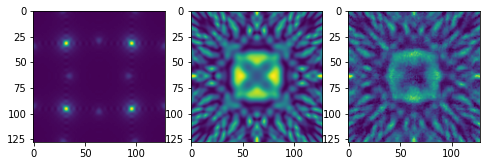

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/3659/Input.npy
Log loss is:  413.45199663533464


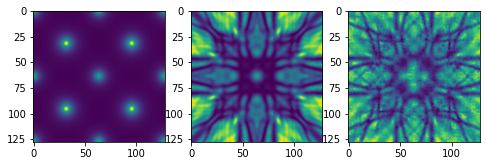

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/418/Input.npy
Log loss is:  429.7006045887061


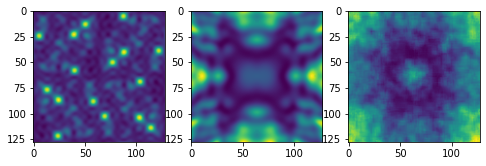

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/4263/Input.npy
Log loss is:  571.8313898514905


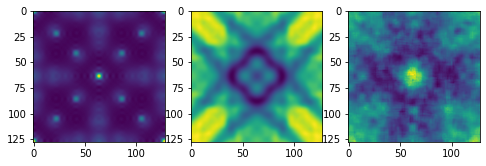

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/4482/Input.npy
Log loss is:  382.26150357119576


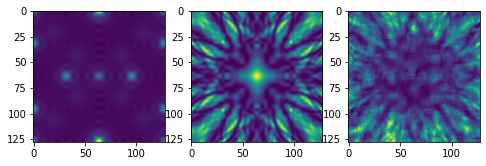

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6421/Input.npy
Log loss is:  108.61450995744315


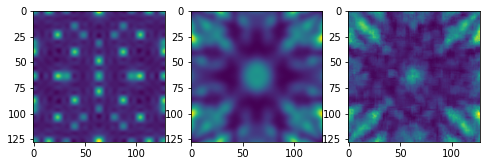

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6651/Input.npy
Log loss is:  200.31977050725754


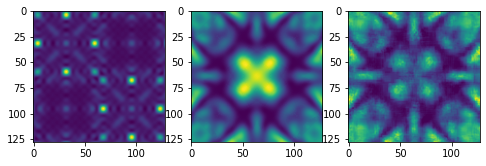

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6670/Input.npy
Log loss is:  461.8564470936374


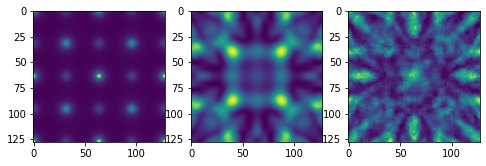

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6736/Input.npy
Log loss is:  104.36415468111703


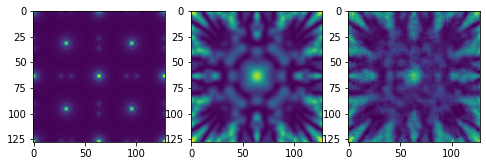

/home/ug-ml/felix-ML/VAE_000/Data/Data/Test/6927/Input.npy
Log loss is:  151.01449852666718


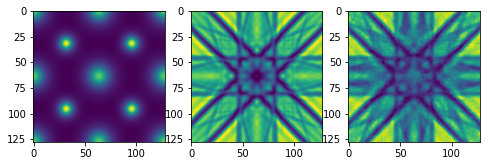

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1039/Input.npy
Log loss is:  212.10382990749812


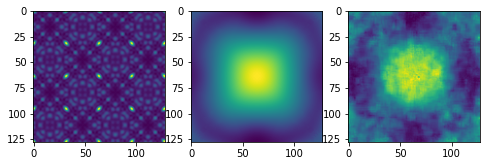

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1081/Input.npy
Log loss is:  364.7275695629005


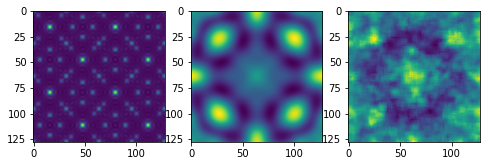

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1126/Input.npy
Log loss is:  98.53382762489314


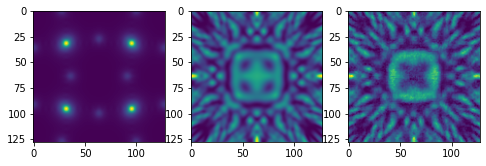

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/114/Input.npy
Log loss is:  436.46936181993345


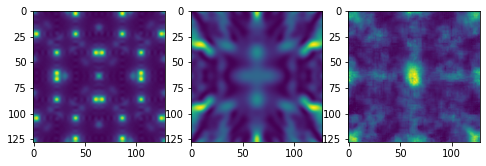

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1165/Input.npy
Log loss is:  229.08516509527865


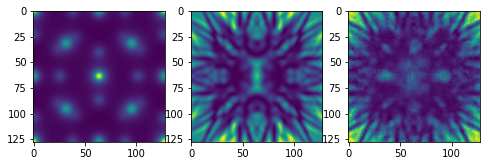

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/117/Input.npy
Log loss is:  247.72720941249892


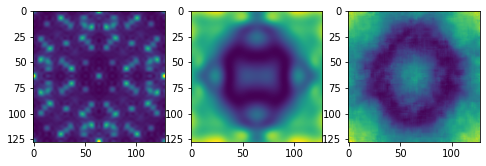

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/121/Input.npy
Log loss is:  371.9966337704534


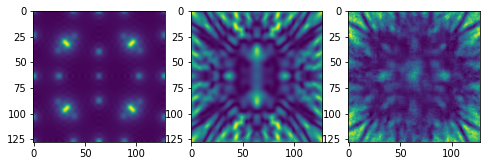

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1218/Input.npy
Log loss is:  451.3337706547819


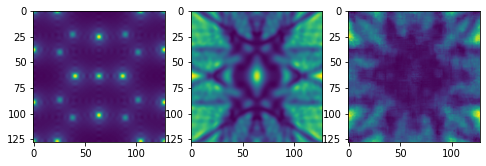

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/123/Input.npy
Log loss is:  301.2455435753595


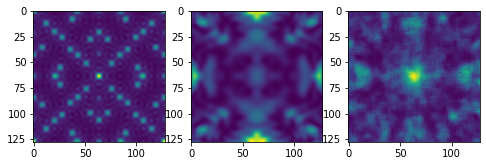

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1240/Input.npy
Log loss is:  290.6073043264951


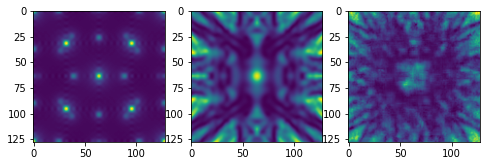

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1321/Input.npy
Log loss is:  75.89496258429419


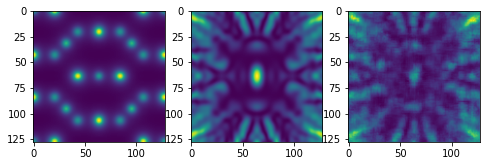

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1446/Input.npy
Log loss is:  118.42320424020636


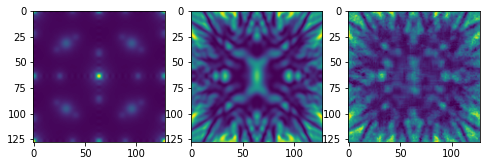

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1707/Input.npy
Log loss is:  379.8499584263257


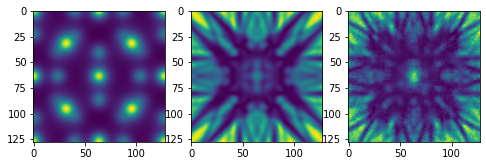

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1786/Input.npy
Log loss is:  556.930170636052


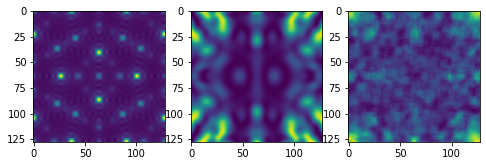

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1797/Input.npy
Log loss is:  238.41768284448278


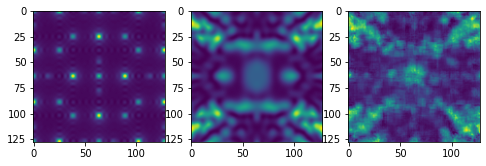

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1803/Input.npy
Log loss is:  85.75635273637867


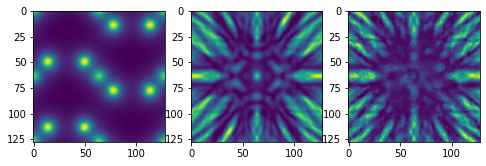

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1848/Input.npy
Log loss is:  462.2463026397471


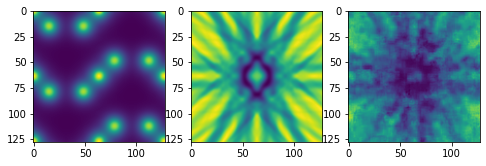

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1858/Input.npy
Log loss is:  200.71601215815636


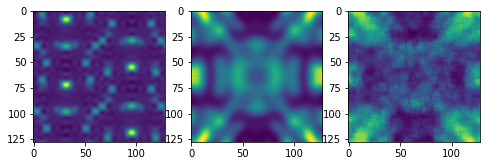

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1934/Input.npy
Log loss is:  108.46559189633376


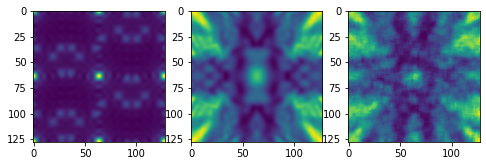

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/1962/Input.npy
Log loss is:  219.48002693960657


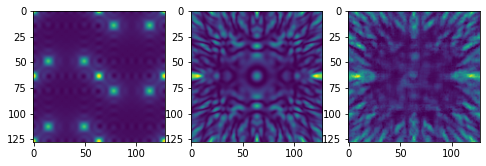

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2034/Input.npy
Log loss is:  228.3525767813614


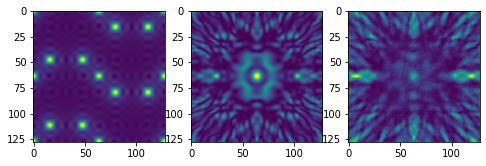

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/210/Input.npy
Log loss is:  158.67416081611339


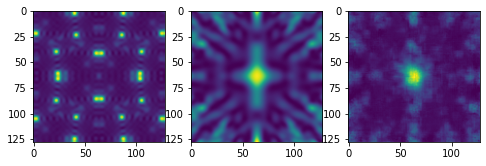

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2175/Input.npy
Log loss is:  269.34163366674886


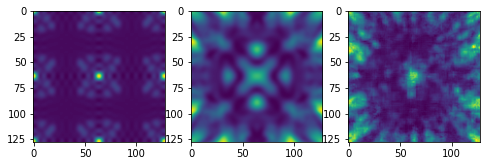

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2183/Input.npy
Log loss is:  116.03035461138784


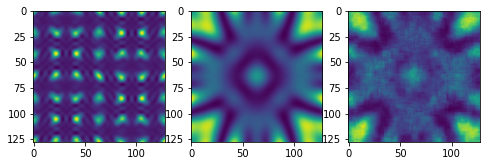

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/220/Input.npy
Log loss is:  180.5653845040941


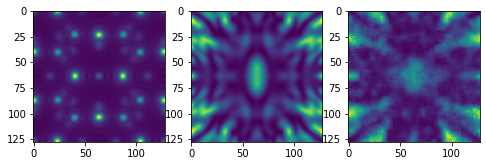

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2201/Input.npy
Log loss is:  601.0116429745161


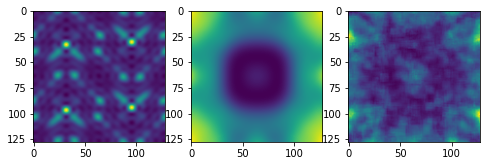

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2236/Input.npy
Log loss is:  192.01960860332056


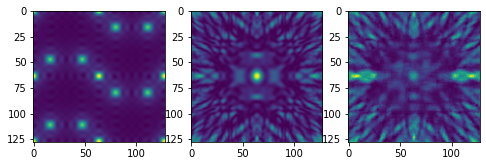

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/225/Input.npy
Log loss is:  117.40876745716322


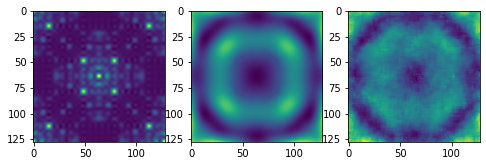

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2253/Input.npy
Log loss is:  240.2098056548578


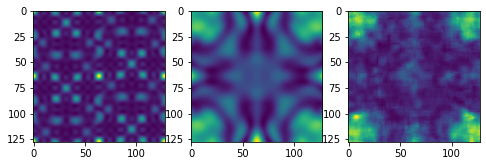

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2255/Input.npy
Log loss is:  218.9492767182108


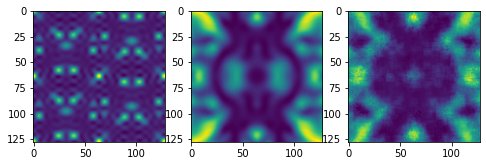

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2322/Input.npy
Log loss is:  431.71009424845727


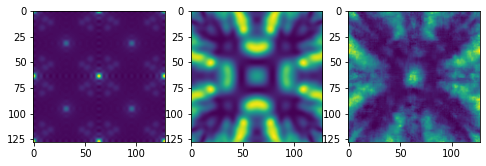

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2323/Input.npy
Log loss is:  306.2685231926467


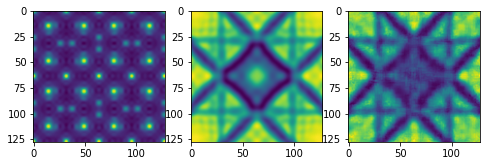

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2351/Input.npy
Log loss is:  284.5877378831681


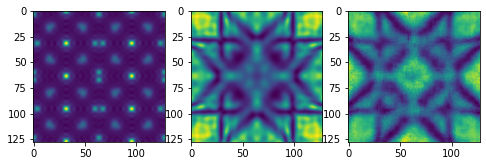

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2372/Input.npy
Log loss is:  49.58026879542775


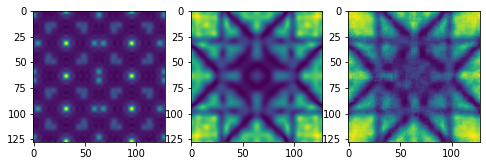

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2537/Input.npy
Log loss is:  140.05931697894803


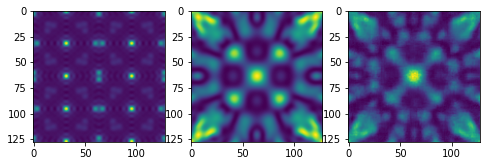

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2608/Input.npy
Log loss is:  106.43148750488623


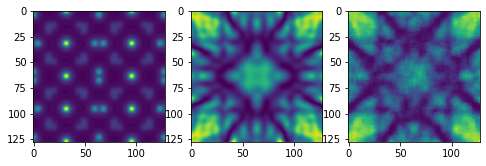

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2757/Input.npy
Log loss is:  156.6348788276149


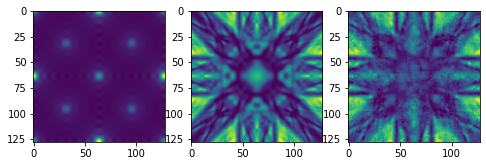

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2826/Input.npy
Log loss is:  299.2408665792081


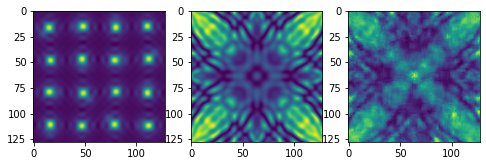

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/294/Input.npy
Log loss is:  142.86008000791045


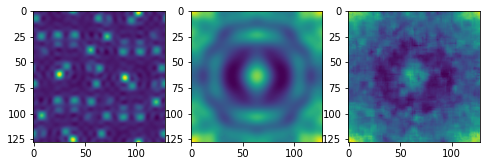

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2984/Input.npy
Log loss is:  199.64480815552085


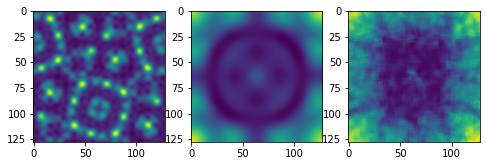

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/2999/Input.npy
Log loss is:  106.32227100894806


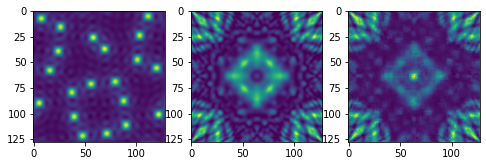

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3170/Input.npy
Log loss is:  455.7958062830398


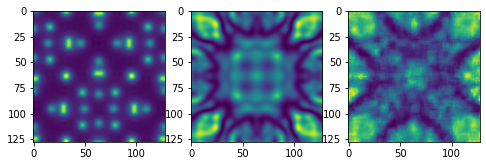

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3188/Input.npy
Log loss is:  300.7634266222665


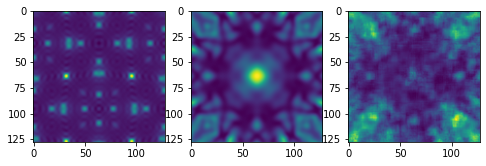

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3222/Input.npy
Log loss is:  95.78049640259455


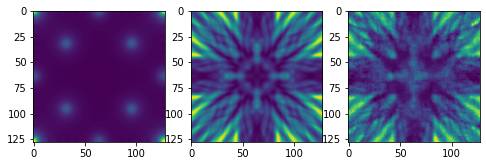

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3255/Input.npy
Log loss is:  326.1135033316504


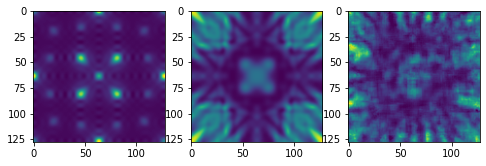

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3279/Input.npy
Log loss is:  275.96707882276104


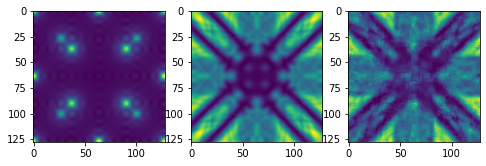

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/334/Input.npy
Log loss is:  613.5192625061683


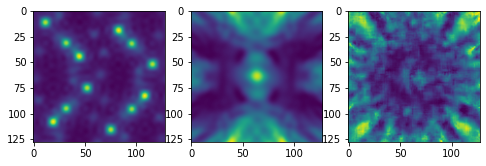

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3372/Input.npy
Log loss is:  767.5963199089829


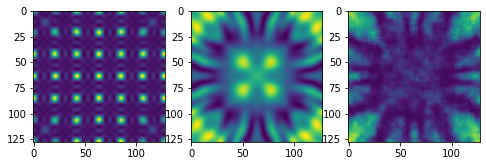

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3382/Input.npy
Log loss is:  208.49934106539902


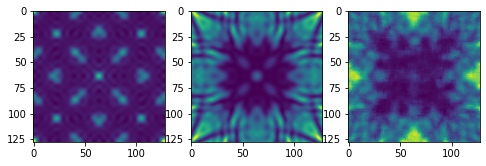

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3413/Input.npy
Log loss is:  54.517291601522665


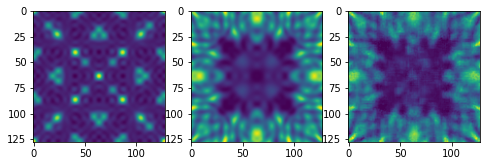

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3465/Input.npy
Log loss is:  948.4518866670174


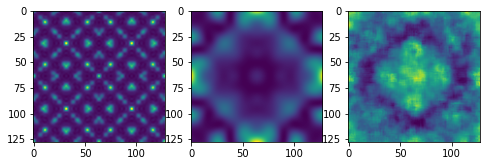

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3510/Input.npy
Log loss is:  327.5913001356551


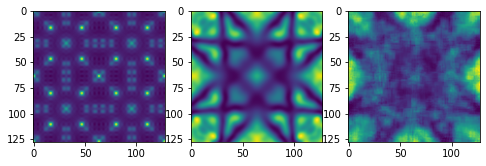

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3514/Input.npy
Log loss is:  168.56318438652121


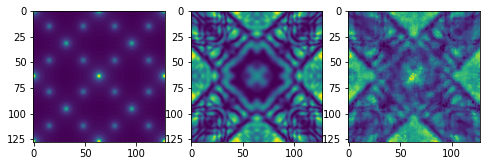

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3533/Input.npy
Log loss is:  229.29410467703562


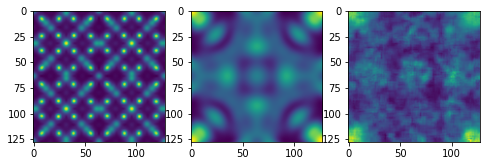

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3623/Input.npy
Log loss is:  141.27946406399096


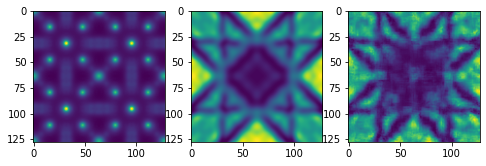

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3635/Input.npy
Log loss is:  376.8886659835855


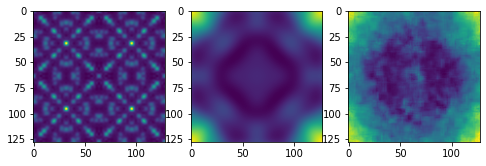

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3684/Input.npy
Log loss is:  115.30671602287147


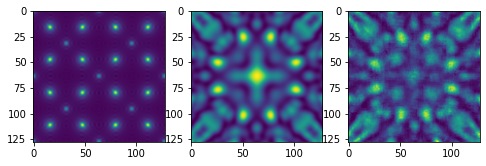

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3834/Input.npy
Log loss is:  248.5914861160371


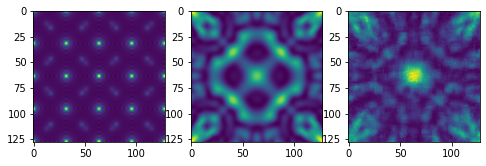

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3947/Input.npy
Log loss is:  353.29156442655034


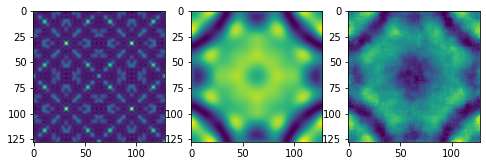

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3975/Input.npy
Log loss is:  543.4497965946542


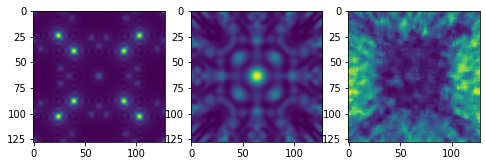

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3979/Input.npy
Log loss is:  114.57546233375137


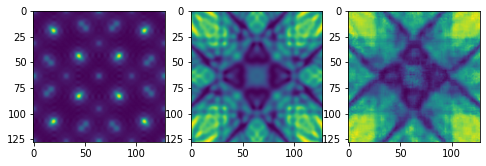

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3988/Input.npy
Log loss is:  280.6045334254381


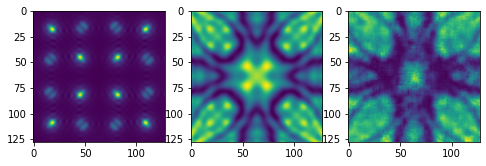

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/3998/Input.npy
Log loss is:  111.03108613606057


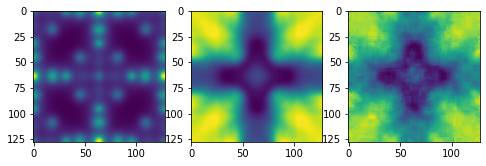

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4012/Input.npy
Log loss is:  328.5549216013573


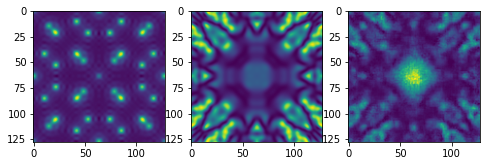

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/402/Input.npy
Log loss is:  1394.9445502739748


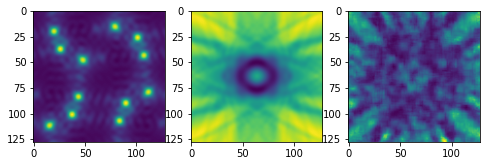

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4030/Input.npy
Log loss is:  260.09873592569335


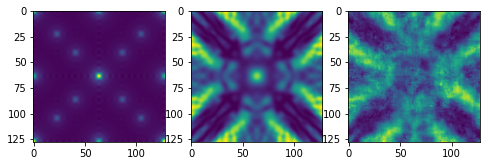

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4194/Input.npy
Log loss is:  594.4133168213002


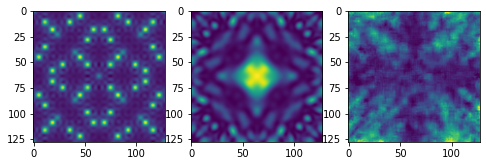

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4318/Input.npy
Log loss is:  195.7595065822569


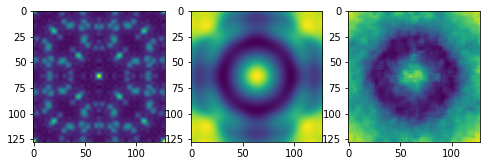

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4411/Input.npy
Log loss is:  875.8949938254387


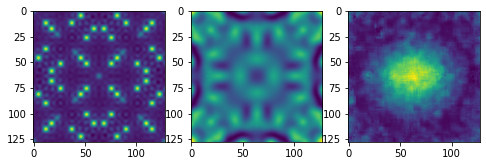

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4476/Input.npy
Log loss is:  120.68870214827675


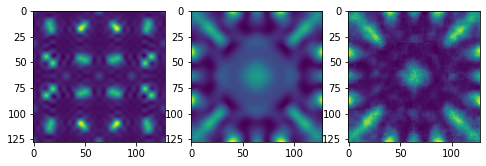

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4525/Input.npy
Log loss is:  140.39789719558942


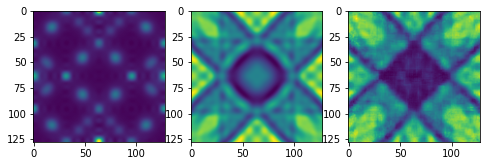

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/455/Input.npy
Log loss is:  355.2532803491429


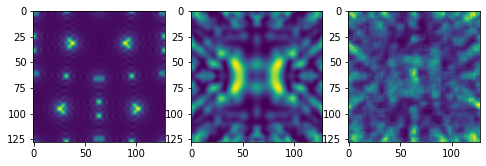

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4708/Input.npy
Log loss is:  112.67191078360544


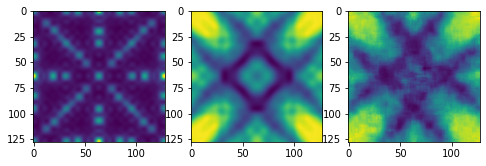

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4768/Input.npy
Log loss is:  230.10551222855426


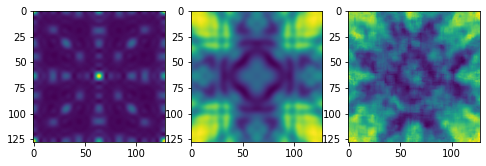

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4837/Input.npy
Log loss is:  75.35909273113387


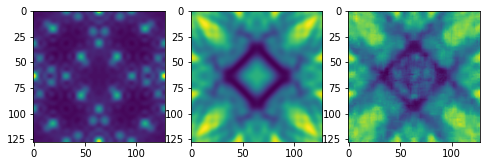

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/4848/Input.npy
Log loss is:  190.90590449965296


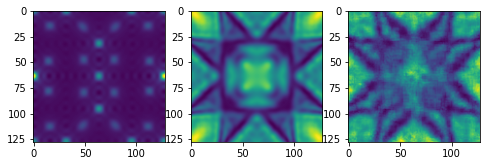

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5107/Input.npy
Log loss is:  62.73086963163245


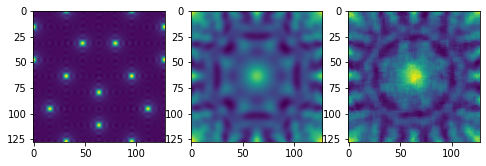

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5150/Input.npy
Log loss is:  157.2685360185941


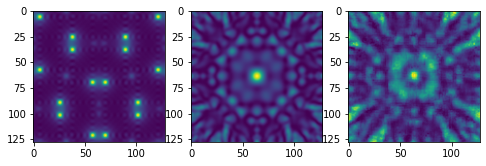

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5165/Input.npy
Log loss is:  93.43134339667587


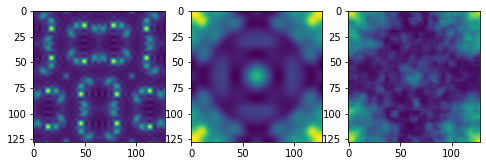

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5181/Input.npy
Log loss is:  370.1389595372388


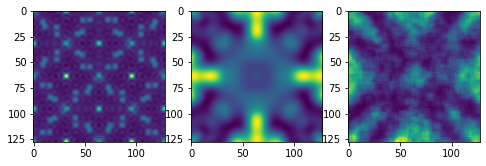

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5211/Input.npy
Log loss is:  164.56501349281632


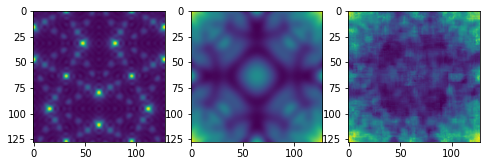

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5228/Input.npy
Log loss is:  44.14554475093984


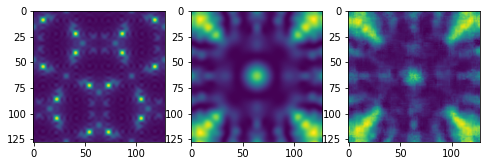

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5308/Input.npy
Log loss is:  204.44031849896174


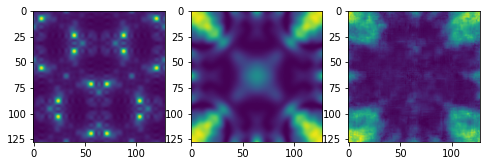

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5326/Input.npy
Log loss is:  332.3842842403705


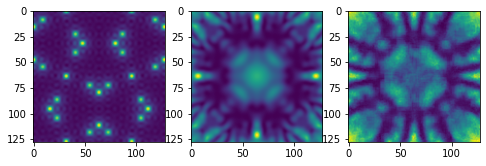

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5368/Input.npy
Log loss is:  255.61692484179395


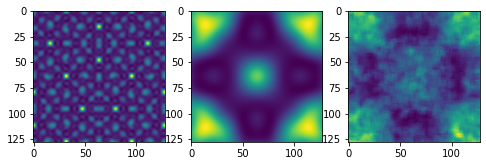

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5418/Input.npy
Log loss is:  123.23548711187837


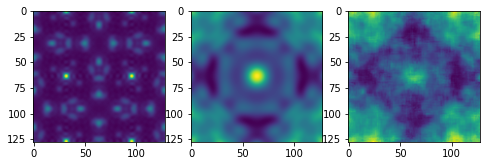

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5434/Input.npy
Log loss is:  514.376441641382


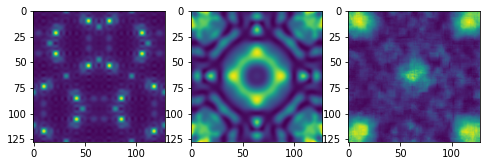

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5435/Input.npy
Log loss is:  376.632660615543


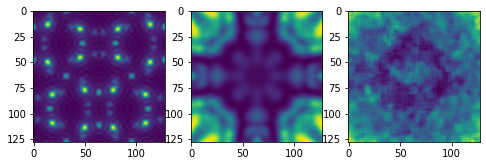

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5443/Input.npy
Log loss is:  187.72793070902864


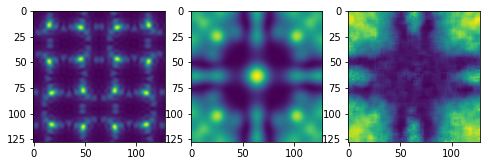

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/5467/Input.npy
Log loss is:  746.7589935090598


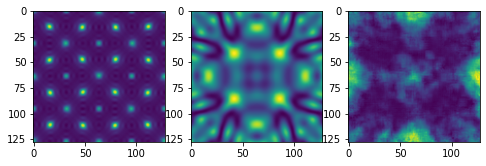

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/57/Input.npy
Log loss is:  534.6555245226776


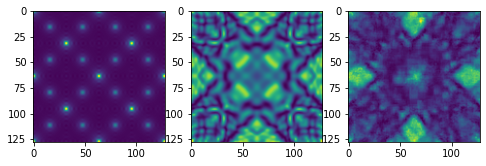

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/635/Input.npy
Log loss is:  323.33706296873316


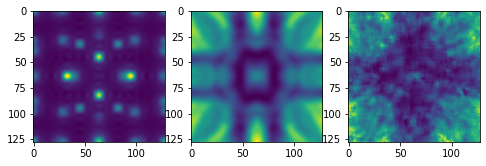

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6355/Input.npy
Log loss is:  355.4112775268894


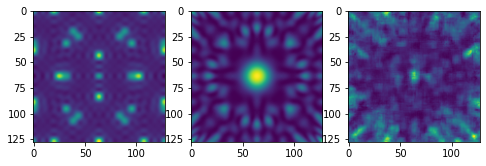

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6374/Input.npy
Log loss is:  102.09175639756975


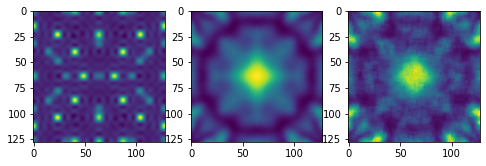

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6533/Input.npy
Log loss is:  532.1085681658005


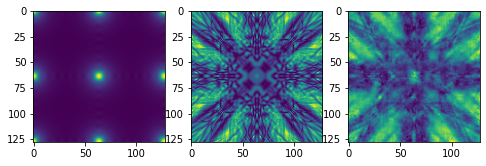

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6538/Input.npy
Log loss is:  958.4826101257631


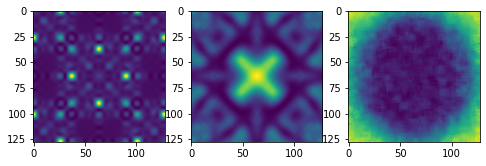

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/661/Input.npy
Log loss is:  291.45514833109274


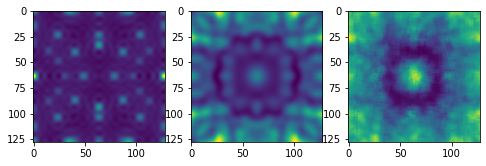

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6685/Input.npy
Log loss is:  160.37215319871515


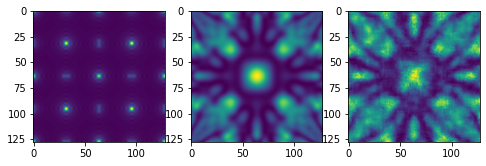

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6692/Input.npy
Log loss is:  368.27754038649147


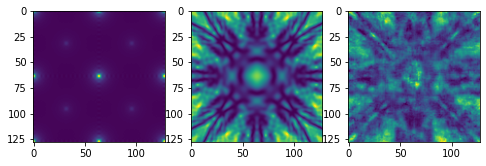

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6731/Input.npy
Log loss is:  175.71255300386764


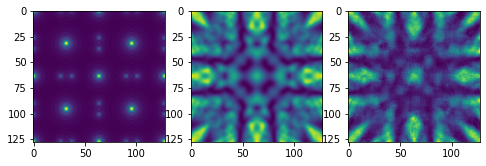

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6777/Input.npy
Log loss is:  81.29457585562758


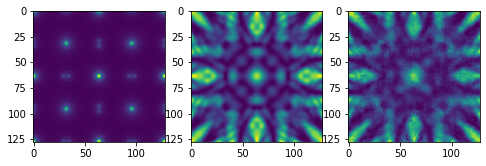

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6778/Input.npy
Log loss is:  86.8982736191444


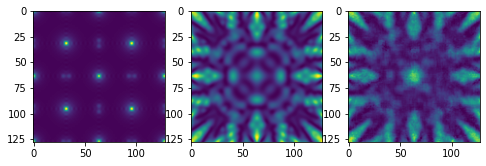

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/678/Input.npy
Log loss is:  121.3688472582282


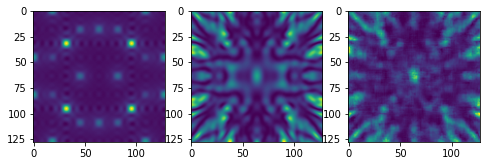

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/684/Input.npy
Log loss is:  241.81239569561998


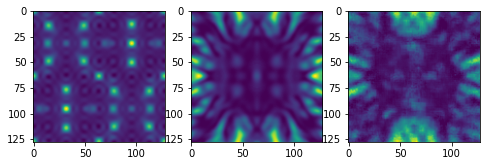

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6890/Input.npy
Log loss is:  512.886074199265


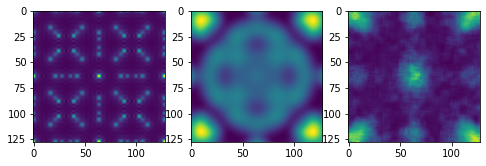

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6891/Input.npy
Log loss is:  101.692715321823


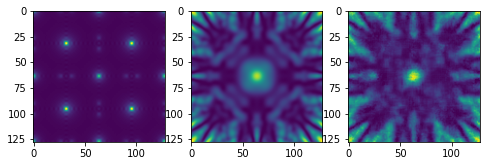

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6893/Input.npy
Log loss is:  346.9576091646433


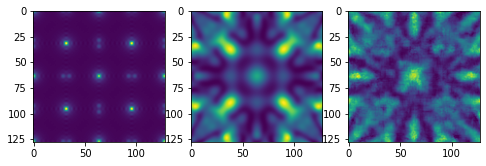

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6905/Input.npy
Log loss is:  366.07125929068894


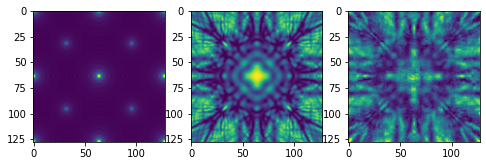

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/6962/Input.npy
Log loss is:  125.74070605197615


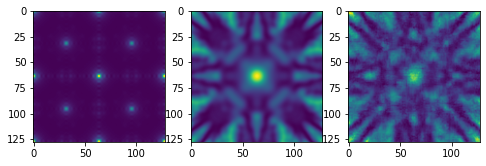

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7022/Input.npy
Log loss is:  44.185982473395065


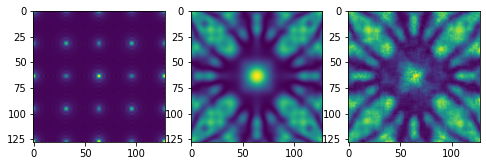

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7036/Input.npy
Log loss is:  388.639587878028


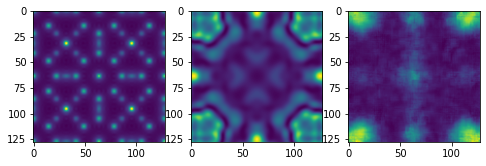

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7067/Input.npy
Log loss is:  168.15723022999614


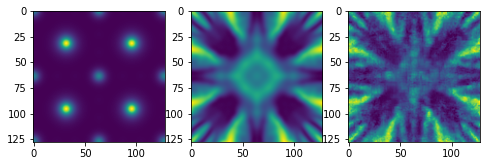

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7084/Input.npy
Log loss is:  213.7433254926193


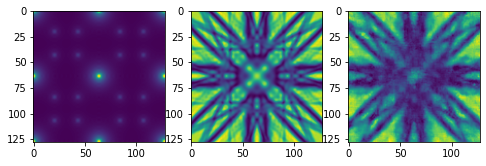

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/712/Input.npy
Log loss is:  123.41964096231273


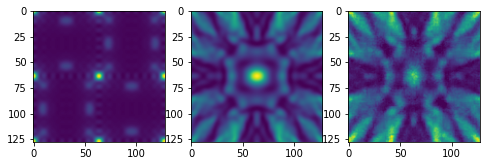

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7144/Input.npy
Log loss is:  462.7902262027655


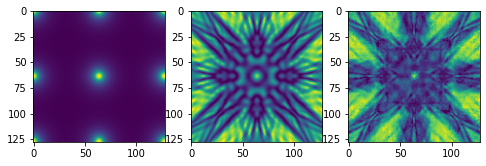

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/720/Input.npy
Log loss is:  333.11809333596557


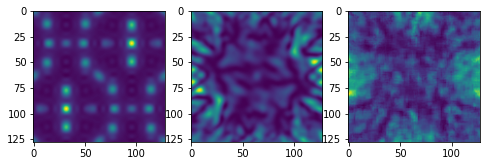

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7300/Input.npy
Log loss is:  198.20811036566013


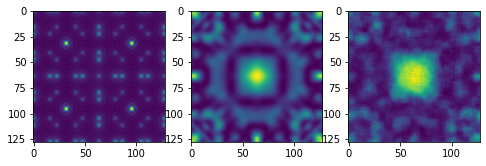

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/7338/Input.npy
Log loss is:  83.00644632514381


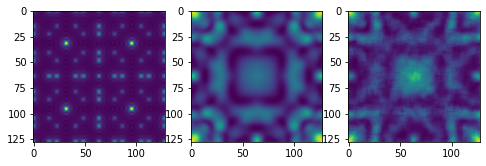

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/798/Input.npy
Log loss is:  352.72769839487194


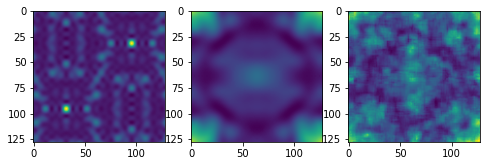

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/854/Input.npy
Log loss is:  347.7828928921877


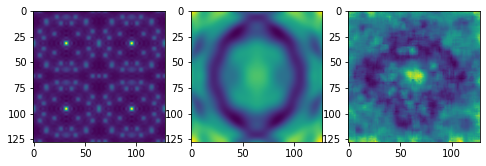

/home/ug-ml/felix-ML/VAE_000/Data/Data/Training/88/Input.npy
Log loss is:  89.03424778944336


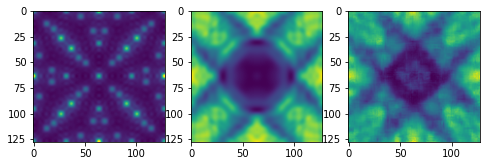

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/1128/Input.npy
Log loss is:  826.0328283103195


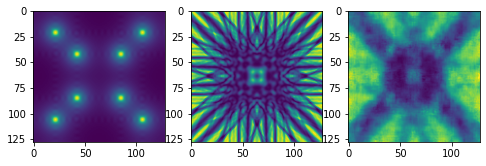

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/142/Input.npy
Log loss is:  148.78312930326706


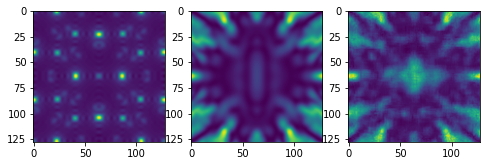

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/1972/Input.npy
Log loss is:  181.20912986910565


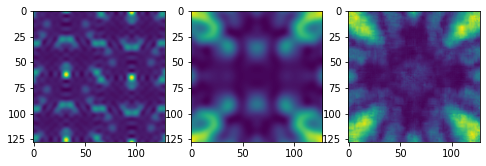

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/2966/Input.npy
Log loss is:  206.72747482513583


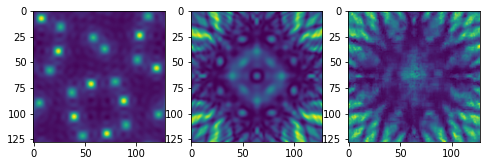

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/3187/Input.npy
Log loss is:  223.30064899617108


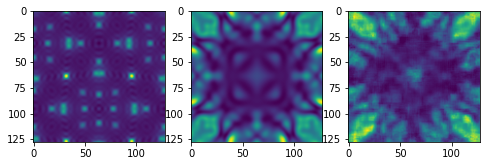

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/5064/Input.npy
Log loss is:  262.93434733230646


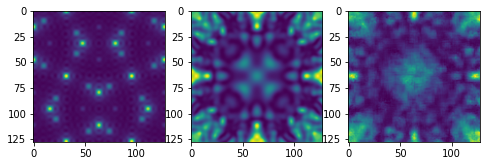

/home/ug-ml/felix-ML/VAE_000/Data/Data/Validation/925/Input.npy
Log loss is:  459.47380576600466


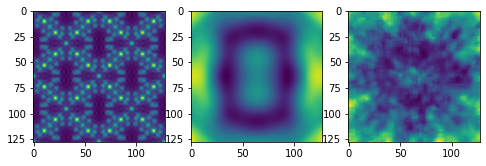

Average loss:  285.6280262190604


In [12]:
import math

average_loss = 0
for i in range(0, len(TestPaths[0])):
    #x = np.load(data[0][0][i])
    #y = np.load(data[0][1][i])
    x = np.load(TestPaths[0][i])
    y = np.load(TestPaths[1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))
    print(TestPaths[0][i])
    log_loss = 0
    for j in range(0, a.shape[0]):
        for k in range(0, a.shape[1]):
            log_loss+=(math.log(1+a[j][k]) - math.log(1+y[j][k])) ** 2
    print("Log loss is: ", log_loss)
    average_loss+=log_loss
    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()
print("Average loss: ", average_loss / len(TestPaths[0]))

In [ ]:
for i in range(0, len(TrainingPaths[0])):
    #x = np.load(data[0][0][i])
    #y = np.load(data[0][1][i])
    x = np.load(TrainingPaths[0][i])
    y = np.load(TrainingPaths[1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))
    print(TrainingPaths[0][i])

    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()